In [1]:
import os
import torch
import yaml
import argparse
import numpy as np
from tqdm.notebook import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from torch.optim import AdamW
from torch.utils.data import DataLoader
from torchvision import transforms
from accelerate import Accelerator
from diffusers import UNet2DModel, DDPMScheduler, DDPMPipeline
from diffusers.optimization import get_cosine_schedule_with_warmup
from datasets import load_dataset
from models.vqvae import VQVAE

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

Using device: cuda


In [3]:
def load_config(config_path):
    with open(config_path, 'r') as file:
        return yaml.safe_load(file)

def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False

def prepare_dataset(dataset_config):
    dataset = load_dataset('imagefolder', data_dir=dataset_config['data_dir'])['train']
    
    preprocess = transforms.Compose([
        transforms.Resize((dataset_config['im_size'], dataset_config['im_size'])),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5], [0.5])
    ])

    def transform(examples):
        images = [preprocess(image.convert("RGB")) for image in examples["image"]]
        return {"images": images}

    dataset.set_transform(transform)
    return DataLoader(dataset, batch_size=dataset_config['batch_size'], shuffle=True)

def sample_images(model, noise_scheduler, config, accelerator):
    pipeline = DDPMPipeline(unet=accelerator.unwrap_model(model), scheduler=noise_scheduler)
    images = pipeline(
        batch_size=config['train_params']['num_generate_images'],
        generator=torch.manual_seed(config['train_params']['random_seed']),
        num_inference_steps=config['diffusion_params']['num_timesteps']
    ).images
    
    fig = plt.figure(figsize=(8, 8))
    for i, image in enumerate(images):
        ax = fig.add_subplot(3, 3, i+1)
        ax.imshow(image)
        ax.axis('off')
    plt.show()

In [4]:
config_path = 'ldm_config.yaml'

In [5]:
config = load_config(config_path)
set_seed(config['train_params']['random_seed'])

dataset_config = config['dataset_params']
train_config = config['train_params']
diffusion_params = config['diffusion_params']
vqvae_config = config['vqvae_params']

In [6]:
train_dataloader = prepare_dataset(dataset_config)

Resolving data files:   0%|          | 0/3031 [00:00<?, ?it/s]

In [7]:
# model = UNet2DModel(
#     sample_size=dataset_config['im_size'],
#     in_channels=vqvae_config['z_channels'],  # Using z_channels from VQ-VAE
#     out_channels=vqvae_config['z_channels'],  # Using z_channels from VQ-VAE
#     layers_per_block=2,
#     block_out_channels=(128, 128, 256, 256, 512, 512),
#     down_block_types=("DownBlock2D",) * 6,
#     up_block_types=("UpBlock2D",) * 6
# ).to(device)

vqvae = VQVAE(
    im_channels=dataset_config['im_channels'],
    model_config=vqvae_config
).to(device)

In [8]:
model = UNet2DModel(
    sample_size=64,  # Reduced sample size
    in_channels=3,
    out_channels=3,
    layers_per_block=2,
    block_out_channels=(64, 64, 128, 128),  # Fewer and smaller blocks
    down_block_types=(
        "DownBlock2D",
        "DownBlock2D",
        "AttnDownBlock2D",  # Added attention block in the down path
        "DownBlock2D"
    ),
    up_block_types=(
        "UpBlock2D",
        "UpBlock2D",
        "AttnUpBlock2D",  # Added attention block in the up path
        "UpBlock2D"
    )
)
model = model.to(device)

In [9]:
vqvae_ckpt_path = vqvae_config['vqvae_ckpt_path']
if os.path.exists(vqvae_ckpt_path):
    vqvae.load_state_dict(torch.load(vqvae_ckpt_path, map_location=device))
    vqvae.eval()

optimizer = AdamW(model.parameters(), lr=train_config['learning_rate'])
lr_scheduler = get_cosine_schedule_with_warmup(
    optimizer=optimizer,
    num_warmup_steps=500,
    num_training_steps=len(train_dataloader) * train_config['num_epochs']
)

noise_scheduler = DDPMScheduler(num_train_timesteps=diffusion_params['num_timesteps'])

accelerator = Accelerator(
    mixed_precision=train_config['mixed_precision'],
    gradient_accumulation_steps=train_config['gradient_accumulation_steps']
)

In [10]:
model, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
    model, optimizer, train_dataloader, lr_scheduler
)


Epochs:   0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [1/50], Loss: 0.5992


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [2/50], Loss: 0.1477


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [3/50], Loss: 0.1106


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [4/50], Loss: 0.1011


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [5/50], Loss: 0.0880


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [6/50], Loss: 0.0921


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [7/50], Loss: 0.0844


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [8/50], Loss: 0.0917


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [9/50], Loss: 0.0887


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [10/50], Loss: 0.0867


  0%|          | 0/1000 [00:00<?, ?it/s]

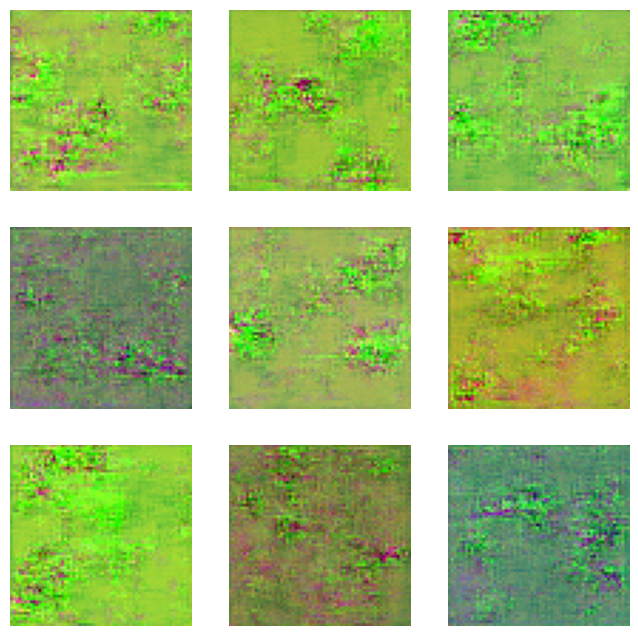

  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [11/50], Loss: 0.0827


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [12/50], Loss: 0.0820


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [13/50], Loss: 0.0819


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [14/50], Loss: 0.0836


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [15/50], Loss: 0.0858


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [16/50], Loss: 0.0788


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [17/50], Loss: 0.0836


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [18/50], Loss: 0.0849


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [19/50], Loss: 0.0825


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [20/50], Loss: 0.0785


  0%|          | 0/1000 [00:00<?, ?it/s]

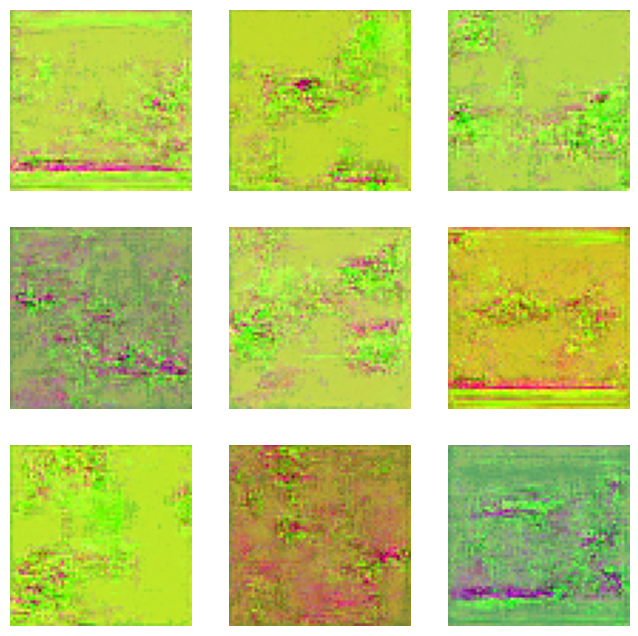

  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [21/50], Loss: 0.0775


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [22/50], Loss: 0.0772


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [23/50], Loss: 0.0774


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [24/50], Loss: 0.0787


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [25/50], Loss: 0.0808


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [26/50], Loss: 0.0749


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [27/50], Loss: 0.0790


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [28/50], Loss: 0.0800


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [29/50], Loss: 0.0781


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [30/50], Loss: 0.0745


  0%|          | 0/1000 [00:00<?, ?it/s]

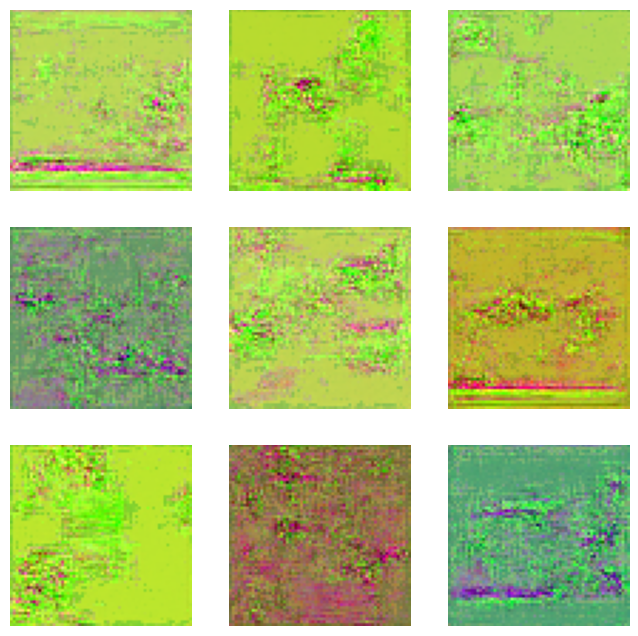

  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [31/50], Loss: 0.0739


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [32/50], Loss: 0.0738


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [33/50], Loss: 0.0742


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [34/50], Loss: 0.0752


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [35/50], Loss: 0.0774


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [36/50], Loss: 0.0725


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [37/50], Loss: 0.0764


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [38/50], Loss: 0.0773


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [39/50], Loss: 0.0759


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [40/50], Loss: 0.0726


  0%|          | 0/1000 [00:00<?, ?it/s]

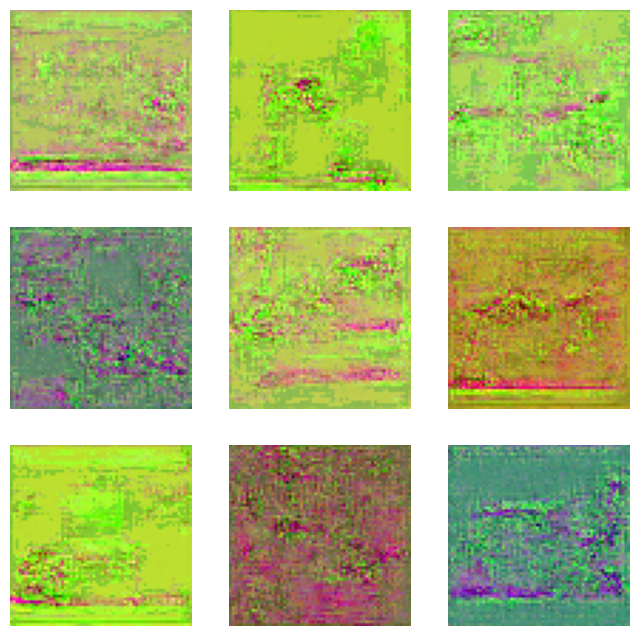

  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [41/50], Loss: 0.0722


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [42/50], Loss: 0.0722


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [43/50], Loss: 0.0729


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [44/50], Loss: 0.0738


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [45/50], Loss: 0.0760


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [46/50], Loss: 0.0716


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [47/50], Loss: 0.0755


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [48/50], Loss: 0.0765


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [49/50], Loss: 0.0753


  0%|          | 0/190 [00:00<?, ?it/s]

Epoch [50/50], Loss: 0.0720


  0%|          | 0/1000 [00:00<?, ?it/s]

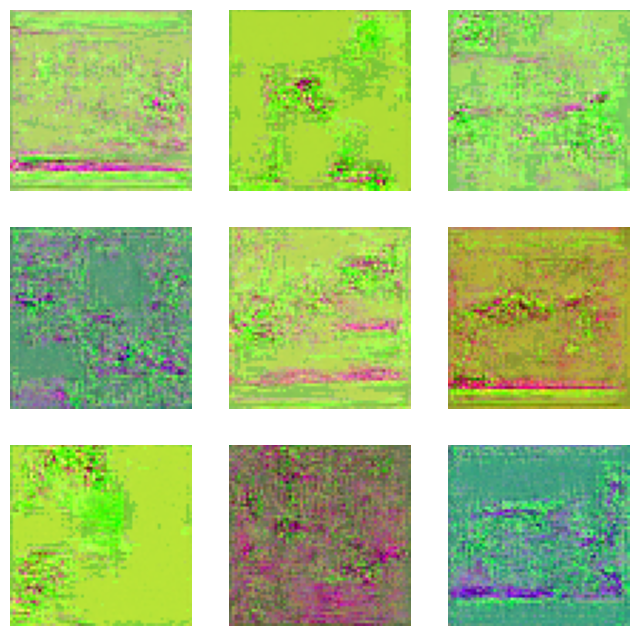

In [44]:
for epoch in tqdm(range(train_config['num_epochs']), desc="Epochs"):
    model.train()
    train_running_loss = 0
    for idx, batch in enumerate(tqdm(train_dataloader), desc=f"Epoch {epoch + 1}/{train_config['num_epochs']}", leave=False, position=0, total=len(train_dataloader)):
        clean_images = batch["images"].to(device)
        
        with torch.no_grad():
            latents, quant_losses = vqvae.encode(clean_images)
            latents = latents.detach()

        noise = torch.randn(latents.shape).to(device)
        timesteps = torch.randint(0, diffusion_params['num_timesteps'], (latents.size(0),)).to(device)
        noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

        with accelerator.accumulate(model):
            # print(f"noisy_latents shape: {noisy_latents.shape}")
            # print(f"timesteps shape: {timesteps.shape}")
            noise_pred = model(noisy_latents, timesteps, return_dict=False)[0]
            loss = torch.nn.functional.mse_loss(noise_pred, noise) + quant_losses['commitment_loss'] + quant_losses['codebook_loss']
            accelerator.backward(loss)
            optimizer.step()
            lr_scheduler.step()
            optimizer.zero_grad()

        train_running_loss += loss.item()

    train_loss = train_running_loss / len(train_dataloader)
    print(f"Epoch [{epoch + 1}/{train_config['num_epochs']}], Loss: {train_loss:.4f}")

    if (epoch + 1) % train_config['log_interval'] == 0:
        sample_images(model, noise_scheduler, config, accelerator)

    if not os.path.exists(train_config['checkpoint_dir']):
        os.makedirs(train_config['checkpoint_dir'])

    checkpoint_path = os.path.join(train_config['checkpoint_dir'], train_config['checkpoint_name'])
    accelerator.save_state(checkpoint_path)

Epochs:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [1/50], Loss: 0.0922


Epoch 2/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [2/50], Loss: 0.0841


Epoch 3/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [3/50], Loss: 0.0906


Epoch 4/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [4/50], Loss: 0.0906


Epoch 5/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [5/50], Loss: 0.0890


  0%|          | 0/1000 [00:00<?, ?it/s]

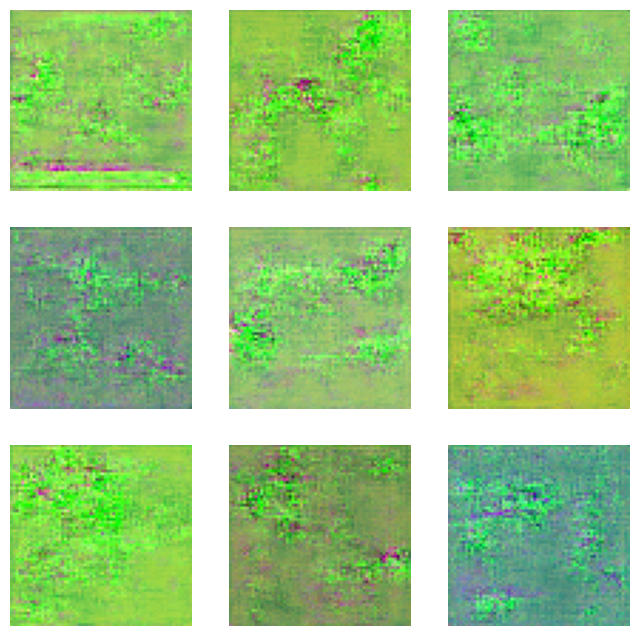

Epoch 6/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [6/50], Loss: 0.0827


Epoch 7/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [7/50], Loss: 0.0821


Epoch 8/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [8/50], Loss: 0.0819


Epoch 9/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [9/50], Loss: 0.0836


Epoch 10/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [10/50], Loss: 0.0858


  0%|          | 0/1000 [00:00<?, ?it/s]

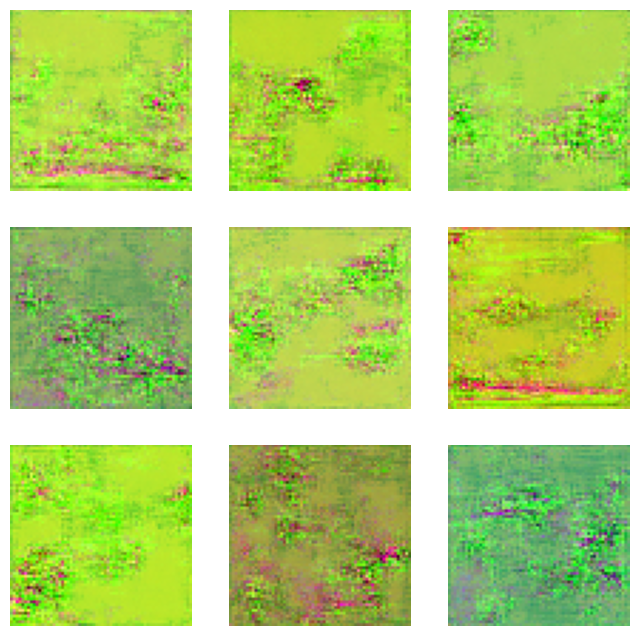

Epoch 11/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [11/50], Loss: 0.0797


Epoch 12/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [12/50], Loss: 0.0793


Epoch 13/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [13/50], Loss: 0.0793


Epoch 14/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [14/50], Loss: 0.0809


Epoch 15/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [15/50], Loss: 0.0831


  0%|          | 0/1000 [00:00<?, ?it/s]

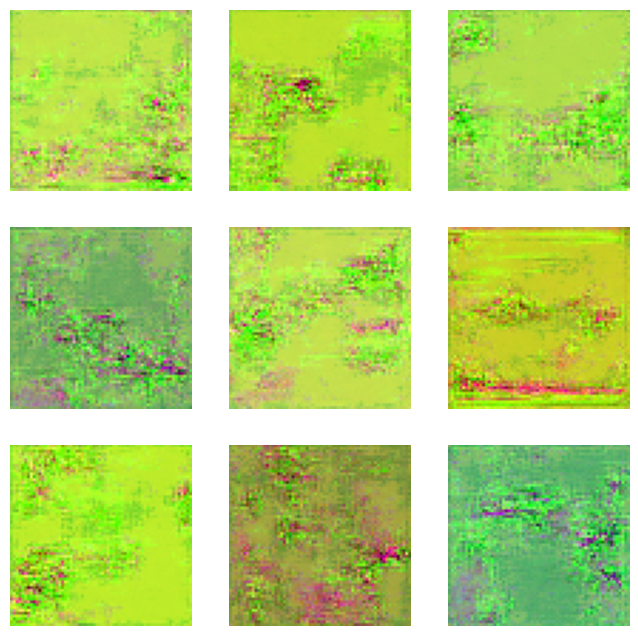

Epoch 16/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [16/50], Loss: 0.0773


Epoch 17/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [17/50], Loss: 0.0771


Epoch 18/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [18/50], Loss: 0.0772


Epoch 19/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [19/50], Loss: 0.0785


Epoch 20/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [20/50], Loss: 0.0807


  0%|          | 0/1000 [00:00<?, ?it/s]

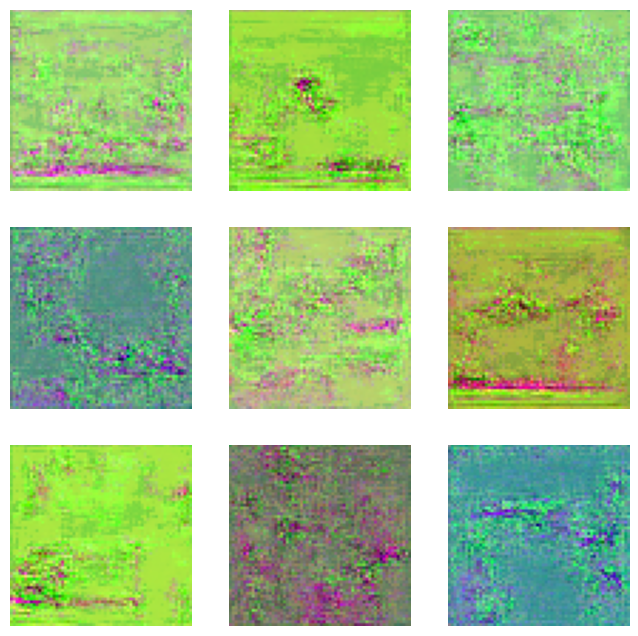

Epoch 21/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [21/50], Loss: 0.0752


Epoch 22/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [22/50], Loss: 0.0751


Epoch 23/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [23/50], Loss: 0.0753


Epoch 24/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [24/50], Loss: 0.0765


Epoch 25/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [25/50], Loss: 0.0786


  0%|          | 0/1000 [00:00<?, ?it/s]

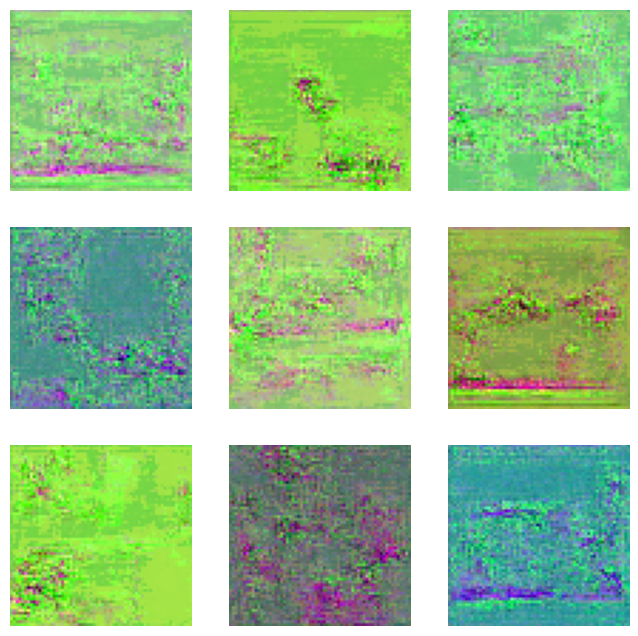

Epoch 26/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [26/50], Loss: 0.0736


Epoch 27/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [27/50], Loss: 0.0735


Epoch 28/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [28/50], Loss: 0.0738


Epoch 29/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [29/50], Loss: 0.0748


Epoch 30/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [30/50], Loss: 0.0770


  0%|          | 0/1000 [00:00<?, ?it/s]

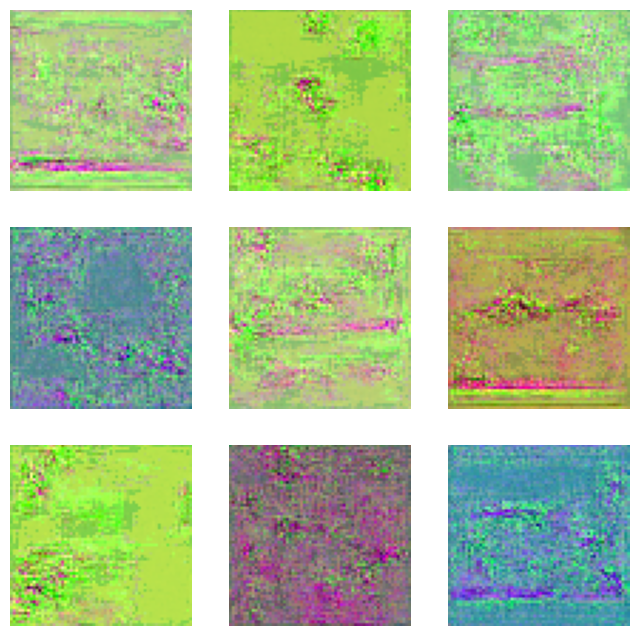

Epoch 31/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [31/50], Loss: 0.0723


Epoch 32/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [32/50], Loss: 0.0721


Epoch 33/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [33/50], Loss: 0.0726


Epoch 34/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [34/50], Loss: 0.0736


Epoch 35/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [35/50], Loss: 0.0758


  0%|          | 0/1000 [00:00<?, ?it/s]

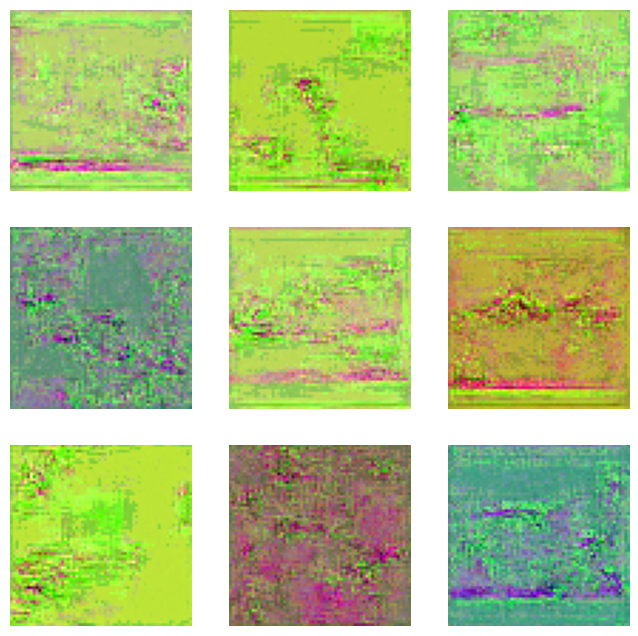

Epoch 36/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [36/50], Loss: 0.0714


Epoch 37/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [37/50], Loss: 0.0713


Epoch 38/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [38/50], Loss: 0.0719


Epoch 39/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [39/50], Loss: 0.0728


Epoch 40/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [40/50], Loss: 0.0751


  0%|          | 0/1000 [00:00<?, ?it/s]

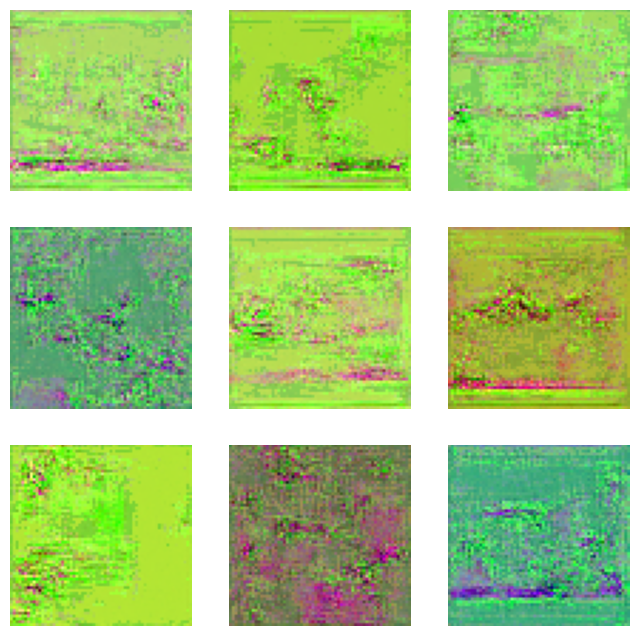

Epoch 41/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [41/50], Loss: 0.0709


Epoch 42/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [42/50], Loss: 0.0710


Epoch 43/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [43/50], Loss: 0.0716


Epoch 44/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [44/50], Loss: 0.0726


Epoch 45/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [45/50], Loss: 0.0750


  0%|          | 0/1000 [00:00<?, ?it/s]

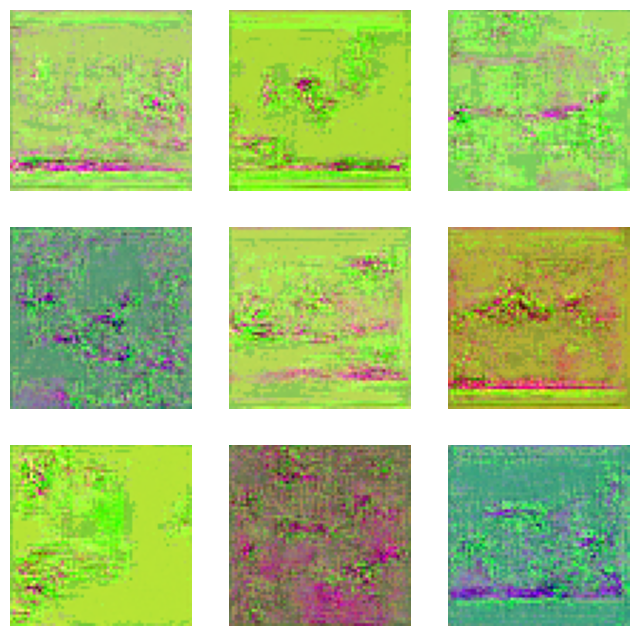

Epoch 46/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [46/50], Loss: 0.0708


Epoch 47/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [47/50], Loss: 0.0709


Epoch 48/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [48/50], Loss: 0.0716


Epoch 49/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [49/50], Loss: 0.0725


Epoch 50/50:   0%|          | 0/190 [00:00<?, ?it/s]

Epoch [50/50], Loss: 0.0749


  0%|          | 0/1000 [00:00<?, ?it/s]

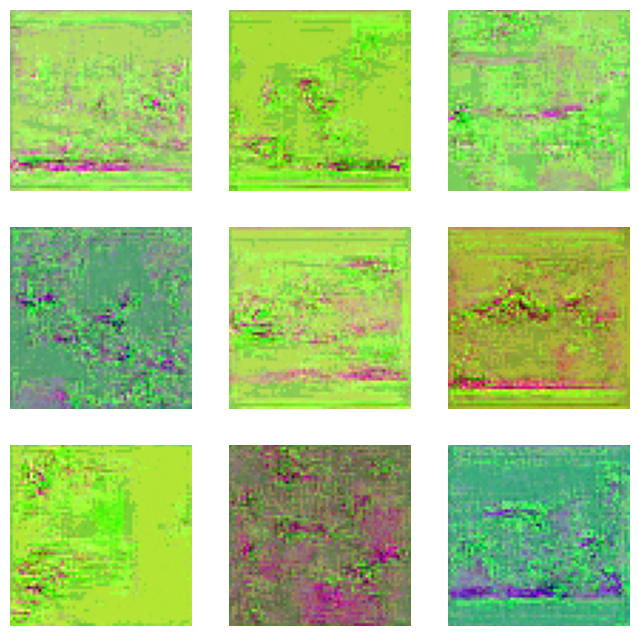

In [13]:
for epoch in tqdm(range(train_config['num_epochs']), desc="Epochs"):
        model.train()
        train_running_loss = 0
        for idx, batch in enumerate(tqdm(train_dataloader, desc=f"Epoch {epoch + 1}/{train_config['num_epochs']}", leave=False, position=0)):
            clean_images = batch["images"].to(device)
            
            with torch.no_grad():
                latents, quant_losses = vqvae.encode(clean_images)
                latents = latents.detach()

            noise = torch.randn(latents.shape).to(device)
            timesteps = torch.randint(0, diffusion_params['num_timesteps'], (latents.size(0),)).to(device)
            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            with accelerator.accumulate(model):
                noise_pred = model(noisy_latents, timesteps, return_dict=False)[0]
                loss = (
                    torch.nn.functional.mse_loss(noise_pred, noise) 
                    + quant_losses['commitment_loss'] 
                    + quant_losses['codebook_loss']
                )
                accelerator.backward(loss)
                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            train_running_loss += loss.item()

        train_loss = train_running_loss / len(train_dataloader)
        print(f"Epoch [{epoch + 1}/{train_config['num_epochs']}], Loss: {train_loss:.4f}")

        if (epoch + 1) % train_config['log_interval'] == 0:
            sample_images(model, noise_scheduler, config, accelerator)

        if not os.path.exists(train_config['checkpoint_dir']):
            os.makedirs(train_config['checkpoint_dir'])

        checkpoint_path = os.path.join(
            train_config['checkpoint_dir'], 
            f"{train_config['checkpoint_name']}_epoch_{epoch + 1}.pt"
        )
        accelerator.save_state(checkpoint_path)
